In [1]:
import string
import wordcloud
import pandas as pd
import numpy as np
import seaborn as sns
from itertools import product
import matplotlib.pyplot as plt
from britain_elects_utils import (parties,
                                  read_data,
                                  process_wvi_data,
                                  null_values_plot,
                                  plot_vote_intention)
from polling_report_history import read_historical_polling_report
%config InlineBackend.figure_format = 'retina'

In [2]:
df = pd.read_csv("./britain_elects_all/britain_elects_all.csv", index_col=0)
chars_to_keep = string.ascii_letters + string.digits + "%- "
df["full_text"] = df["full_text"].str.replace("\n", " ")
df["full_text"] = df["full_text"].apply(lambda x: ''.join([char for char in x if char in chars_to_keep]).lower())

In [3]:
wcloud = wordcloud.WordCloud(background_color='white', width=1500, height=800).generate(' '.join(df["full_text"]))

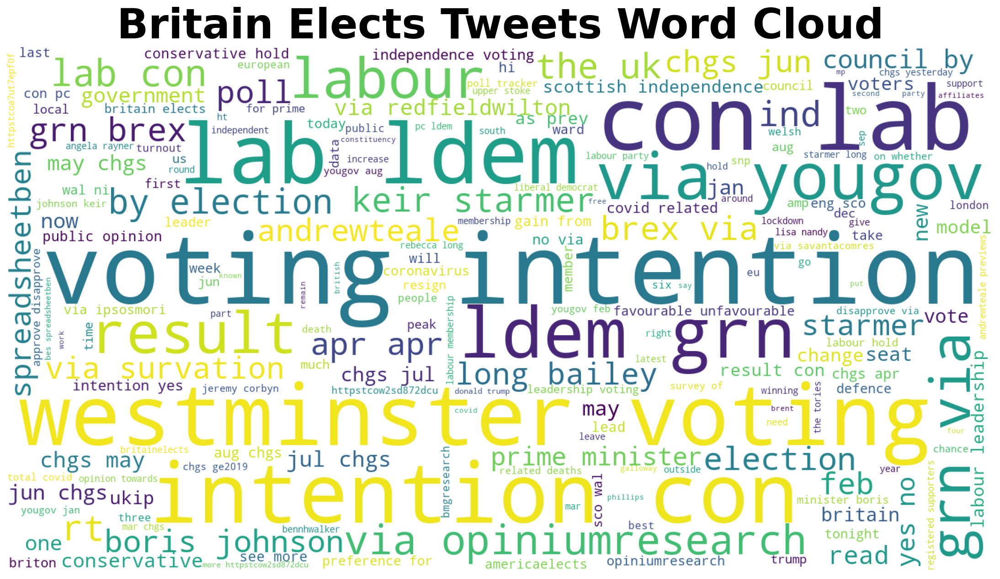

In [4]:
plt.figure(figsize=(15, 8), facecolor=None) 
plt.imshow(wcloud) 
plt.axis("off") 
plt.tight_layout(pad=0) 
plt.title("Britain Elects Tweets Word Cloud", fontweight="bold", fontsize=45);

In [5]:
df = read_data("britain_elects_wvi_data")
df = process_wvi_data(df)

In [6]:
df.tail()

,created_at,source,start,end,change_info,GRN,GRN_change,LAB,LAB_change,LDEM,LDEM_change,SNP,SNP_change,CON,CON_change,BREX,BREX_change,UKIP,UKIP_change,collection_source
date,,,,,,,,,,,,,,,,,,,,
2020-08-29 18:52:32,2020-08-29 18:52:32,,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,britainelects
2020-09-02 00:00:00,2020-09-03 16:10:56,RedfieldWilton,2020-09-01,2020-09-02,24 Aug,4.0,-1.0,37.0,0.0,8.0,-1.0,NaN,NaN,43.0,1.0,NaN,NaN,NaN,NaN,britainelects
2020-09-04 00:00:00,2020-09-08 15:35:03,Survation,2020-09-02,2020-09-04,NaN,4.0,0.0,38.0,1.0,8.0,-1.0,NaN,NaN,40.0,-1.0,NaN,NaN,NaN,NaN,britainelects
2020-09-12 18:59:53,2020-09-12 18:59:53,OpiniumResearch,NaT,NaT,28 Aug,NaN,NaN,39.0,-1.0,NaN,NaN,NaN,NaN,42.0,2.0,NaN,NaN,NaN,NaN,britainelects
2020-09-04 00:00:00,2020-09-14 19:59:59,YouGov,2020-08-28,2020-09-04,Jun,3.0,0.0,41.0,2.0,2.0,-3.0,NaN,NaN,33.0,-2.0,4.0,2.0,NaN,NaN,britainelects


In [7]:
histo = read_historical_polling_report()
histo.head()

,source,end,CON,LAB,LDEM,UKIP,GRN,collection_source
date,,,,,,,,
2019-12-11,DeltapollUK,2019-12-11,45,35,10,NaN,3.0,uk_prh
2019-12-11,KantarPublic,2019-12-11,44,32,13,NaN,3.0,uk_prh
2019-12-11,BMGResearch,2019-12-11,41,32,14,NaN,3.0,uk_prh
2019-12-11,OpiniumResearch,2019-12-11,45,33,12,NaN,2.0,uk_prh
2019-12-11,Panelbase,2019-12-11,43,34,11,NaN,3.0,uk_prh


In [8]:
df = pd.concat([histo, df]).sort_index()
df

,source,end,CON,LAB,LDEM,UKIP,GRN,collection_source,created_at,start,change_info,GRN_change,LAB_change,LDEM_change,SNP,SNP_change,CON_change,BREX,BREX_change,UKIP_change
date,,,,,,,,,,,,,,,,,,,,
2010-05-13 00:00:00,ICM,2010-05-13,38.0,33.0,21.0,NaN,NaN,uk_prh,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-05-13 00:00:00,ComRes,2010-05-13,38.0,34.0,21.0,NaN,NaN,uk_prh,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-05-14 00:00:00,YouGov,2010-05-14,37.0,34.0,21.0,NaN,NaN,uk_prh,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-05-21 00:00:00,YouGov,2010-05-21,39.0,32.0,21.0,NaN,NaN,uk_prh,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-05-21 00:00:00,OpiniumResearch,2010-05-21,38.0,29.0,21.0,NaN,NaN,uk_prh,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-08-29 18:52:32,,NaT,NaN,NaN,NaN,NaN,NaN,britainelects,2020-08-29 18:52:32,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-09-02 00:00:00,RedfieldWilton,2020-09-02,43.0,37.0,8.0,NaN,4.0,britainelects,2020-09-03 16:10:56,2020-09-01,24 Aug,-1.0,0.0,-1.0,NaN,NaN,1.0,NaN,NaN,NaN
2020-09-04 00:00:00,Survation,2020-09-04,40.0,38.0,8.0,NaN,4.0,britainelects,2020-09-08 15:35:03,2020-09-02,NaN,0.0,1.0,-1.0,NaN,NaN,-1.0,NaN,NaN,NaN


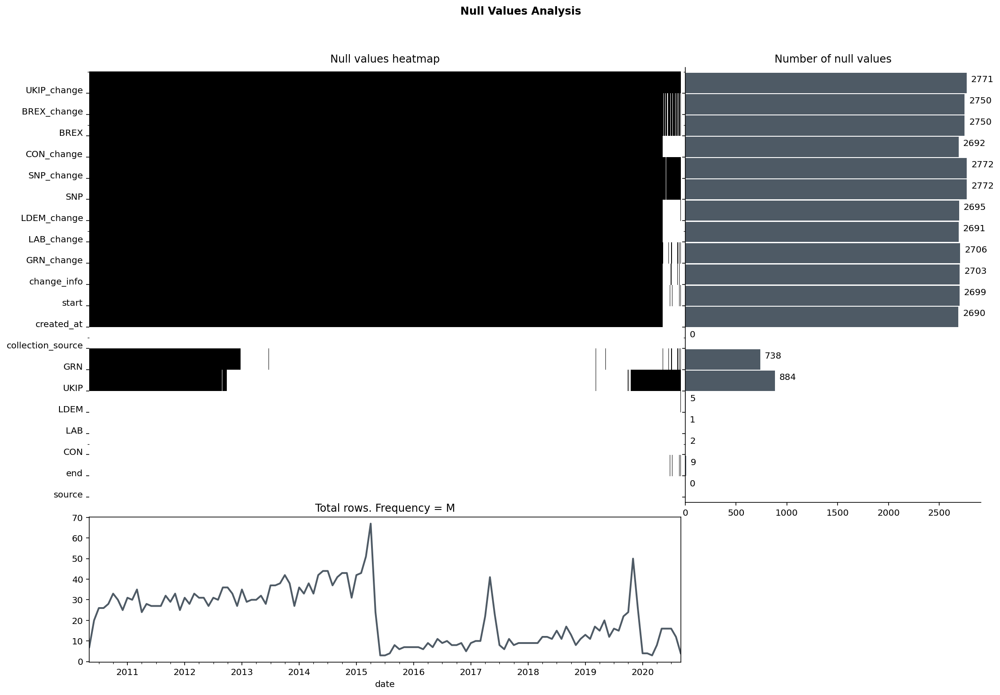

In [9]:
null_values_plot(df)

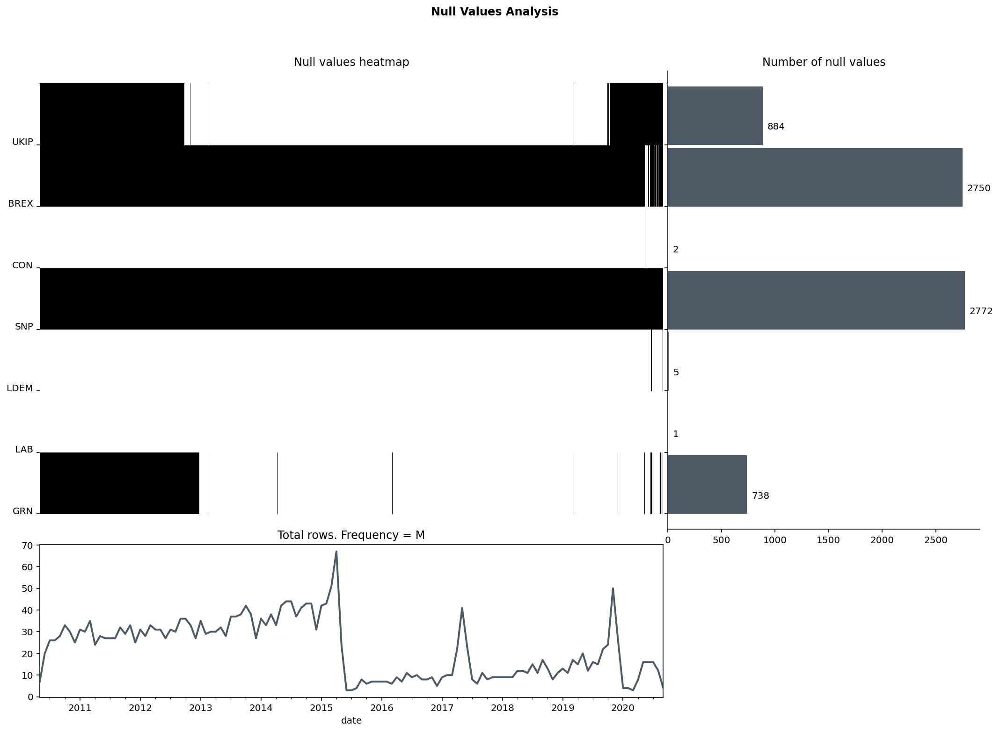

In [10]:
null_values_plot(df[list(parties)])

In [11]:
plt.style.use("fivethirtyeight")

(<Figure size 1440x720 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f191c09a310>)

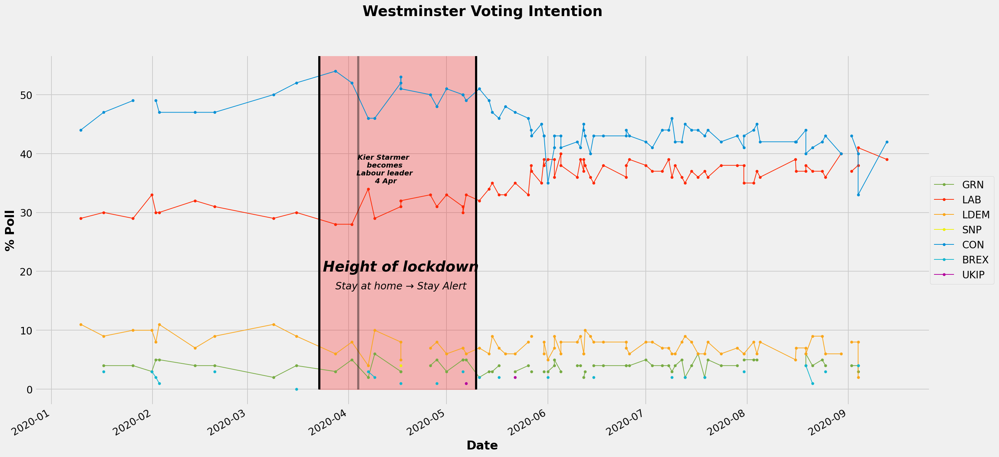

In [12]:
plot_vote_intention(df[df["collection_source"] == "britainelects"], add_lockdown_context=True)

(<Figure size 1440x1080 with 2 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f191d44ccd0>)

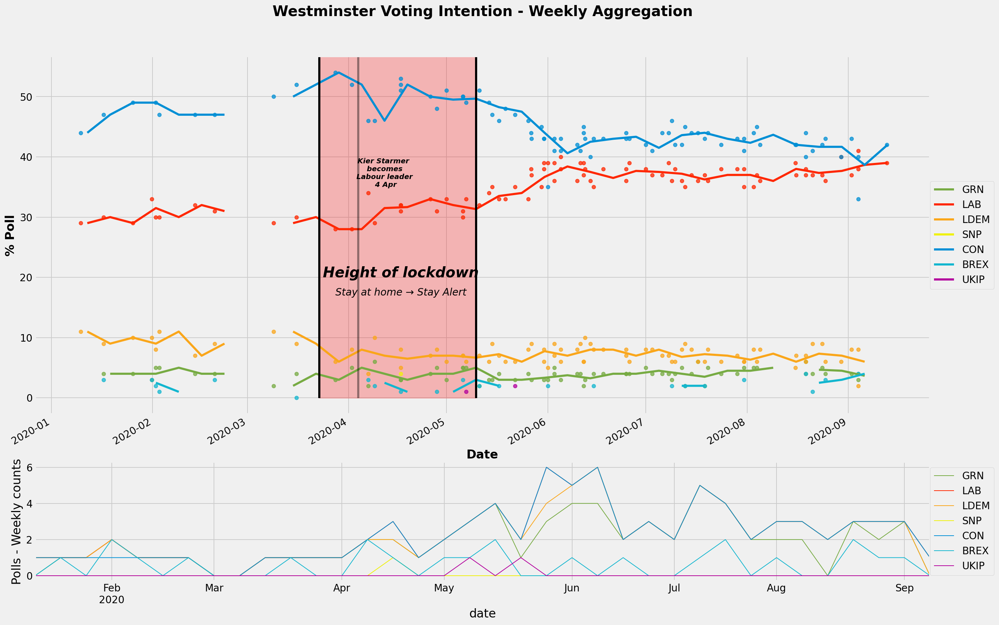

In [13]:
plot_vote_intention(df[df["collection_source"] == "britainelects"], agg="W", add_lockdown_context=True, markersize=5)

(<Figure size 1440x720 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f191d3cf130>)

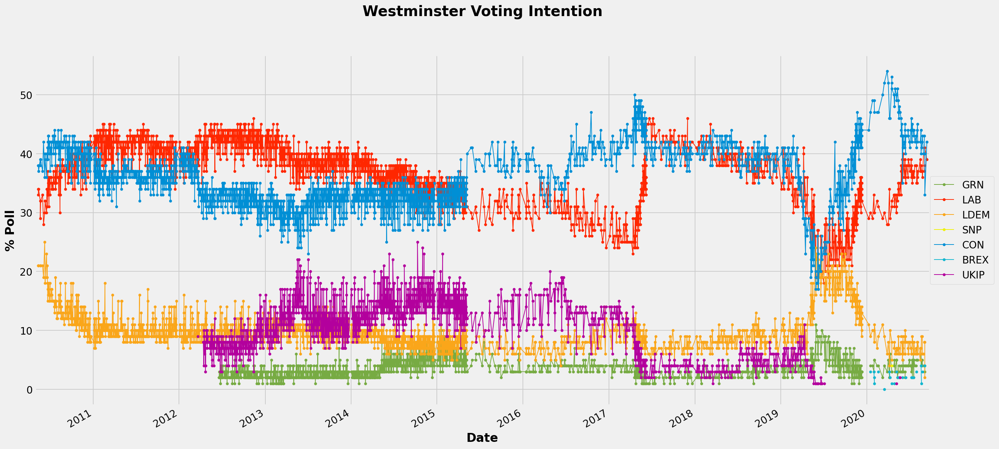

In [14]:
plot_vote_intention(df)

(<Figure size 1440x1080 with 2 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f191c0654c0>)

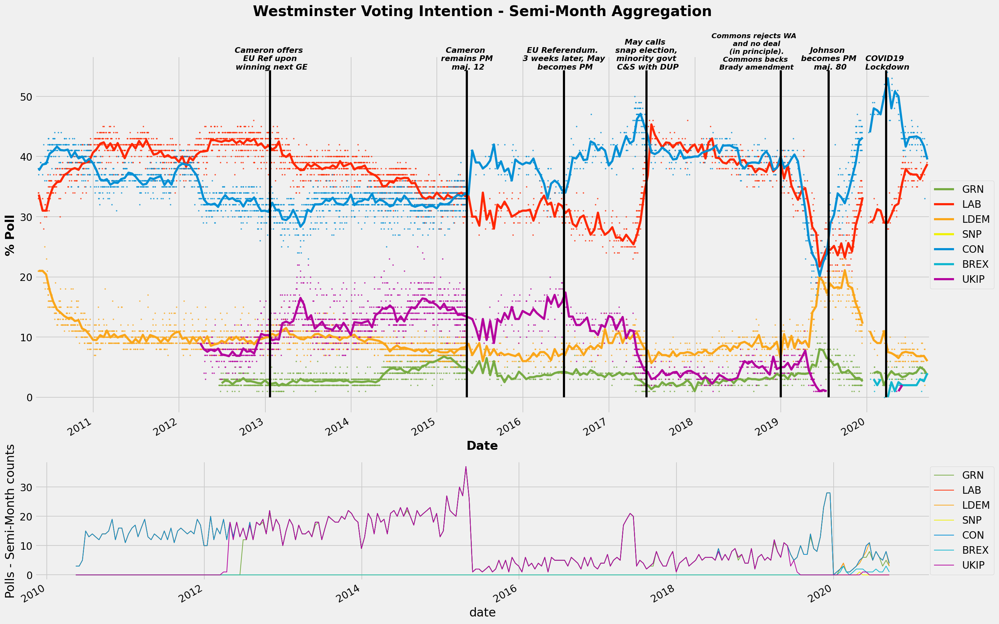

In [15]:
plot_vote_intention(df, agg='SM', add_lifetime_context=True)

(<Figure size 1440x1080 with 2 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f191454f760>)

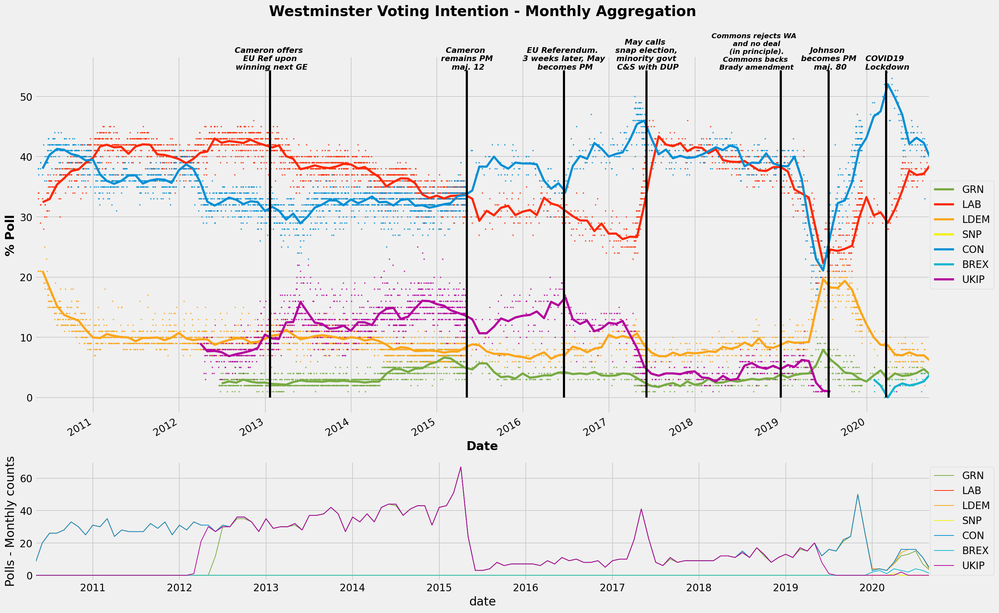

In [16]:
plot_vote_intention(df, agg='M', add_lifetime_context=True)

In [17]:
df[list(parties)].info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2773 entries, 2010-05-13 00:00:00 to 2020-09-12 18:59:53
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   GRN     2035 non-null   float64
 1   LAB     2772 non-null   float64
 2   LDEM    2768 non-null   float64
 3   SNP     1 non-null      float64
 4   CON     2771 non-null   float64
 5   BREX    23 non-null     float64
 6   UKIP    1889 non-null   float64
dtypes: float64(7)
memory usage: 173.3 KB


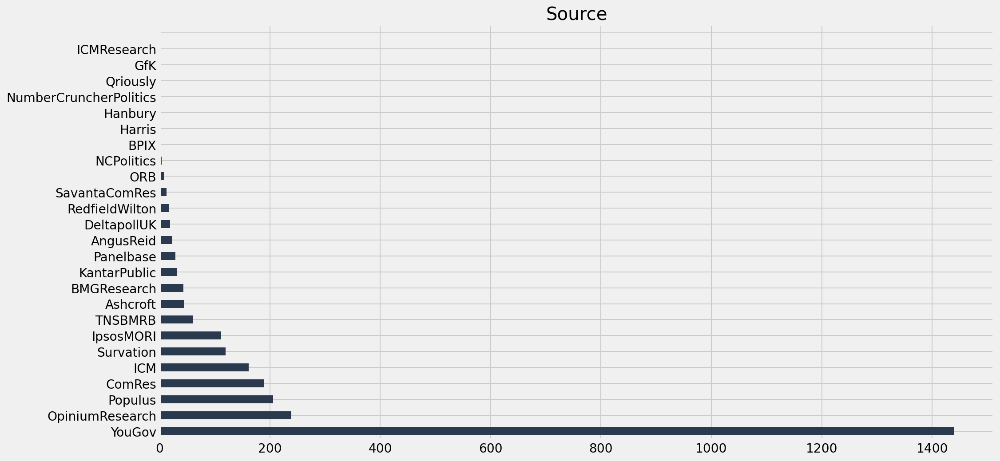

In [18]:
fig, ax = plt.subplots(1, 1, figsize=(15, 8))
df["source"].value_counts().plot(kind='barh', ax=ax, color="#2b394f")
ax.set_title("Source");

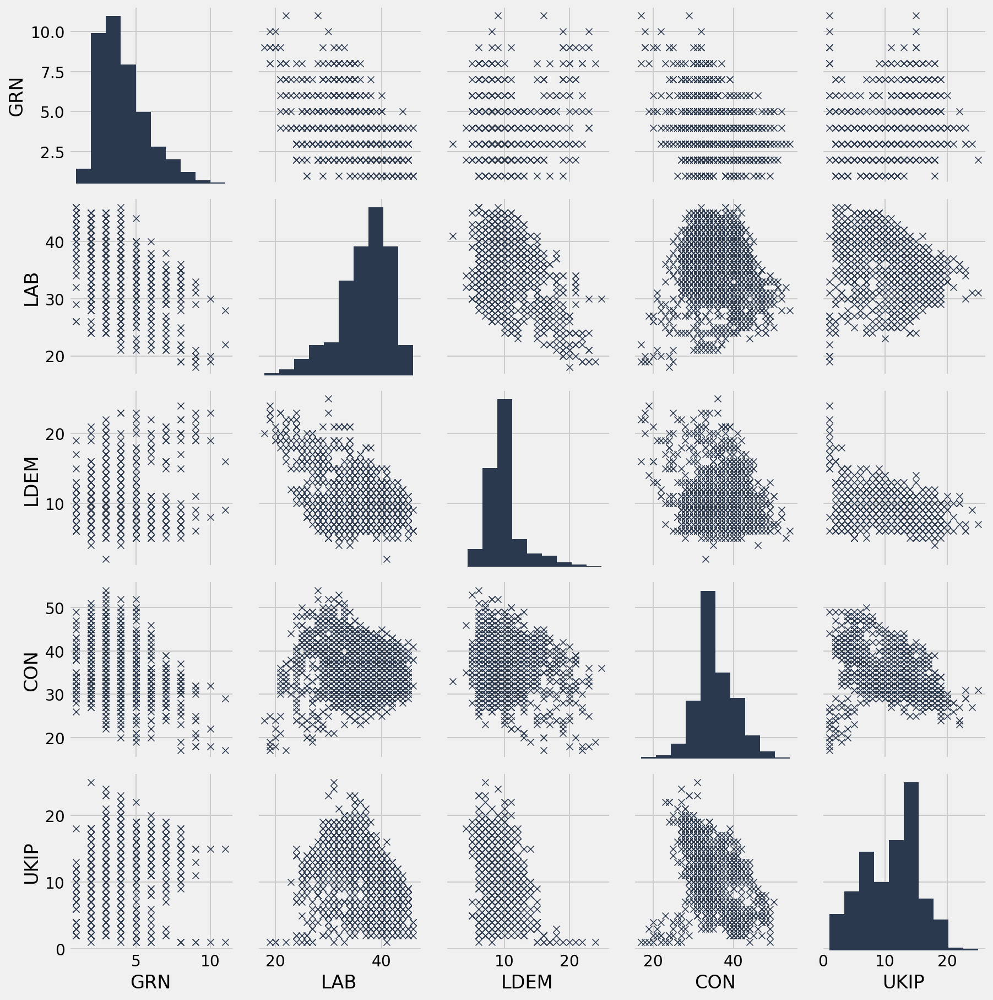

In [19]:
sns.pairplot(df[['GRN', 'LAB', 'LDEM', 'CON', 'UKIP']], markers="x",
             diag_kws={"color": "#2b394f"},
             plot_kws={"color": "#2b394f"});

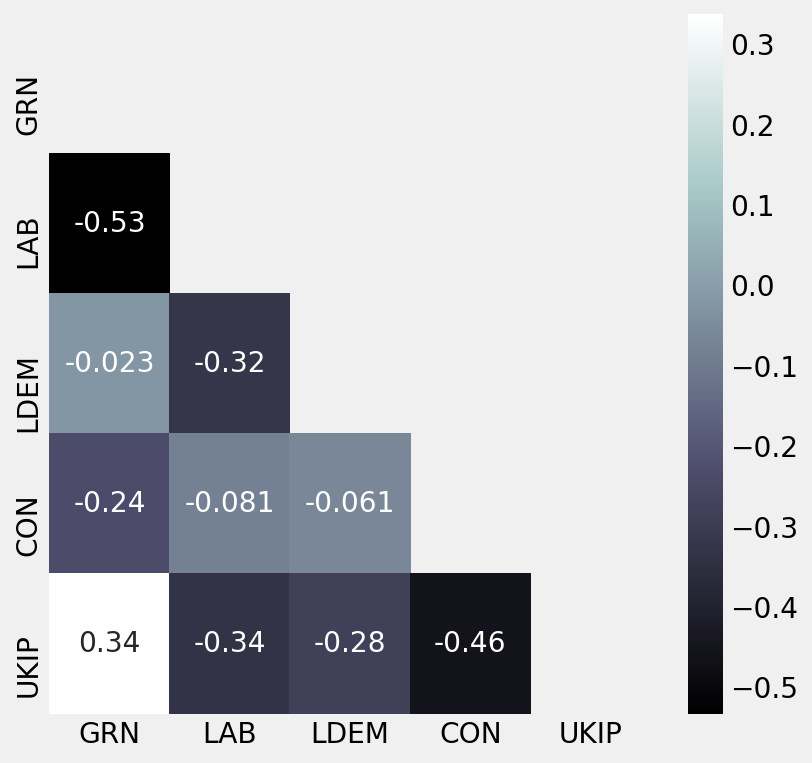

In [20]:
corr = df[['GRN', 'LAB', 'LDEM', 'CON', 'UKIP']].corr()
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
plt.figure(figsize=(6, 6))
sns.heatmap(corr, annot=True, cmap='bone', mask=mask);

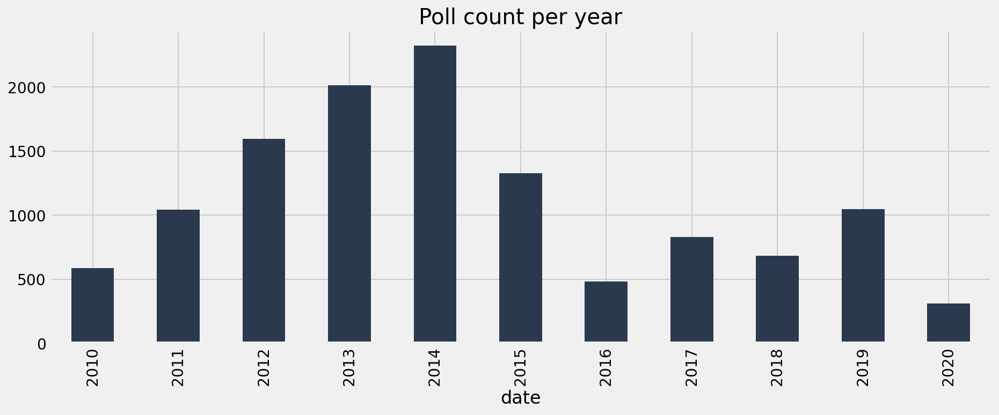

In [21]:
df.groupby(df.index.year)[['GRN', 'LAB', 'LDEM', 'CON', 'UKIP']].count().sum(axis='columns').plot.bar(figsize=(14, 5), color="#2b394f")
plt.title("Poll count per year");

In [22]:
df_w = df.resample("W").mean()

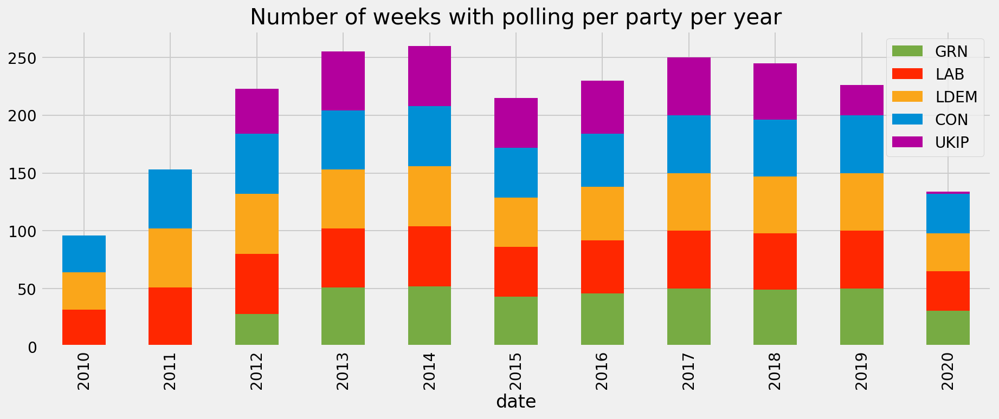

In [23]:
(df_w.groupby(df_w.index.year)[['GRN', 'LAB', 'LDEM', 'CON', 'UKIP']].count()
 .plot.bar(stacked=True,
           figsize=(14, 5),
           color=["#77AB43", "#FF2700", "#FAA61A", "#008FD5", "#B3009D"]));
plt.title("Number of weeks with polling per party per year");

In [24]:
df_w.groupby(df_w.index.year)[['GRN', 'LAB', 'LDEM', 'CON', 'UKIP']].count()

,GRN,LAB,LDEM,CON,UKIP
date,,,,,
2010,0,32,32,32,0
2011,0,51,51,51,0
2012,28,52,52,52,39
2013,51,51,51,51,51
2014,52,52,52,52,52
2015,43,43,43,43,43
2016,46,46,46,46,46
2017,50,50,50,50,50
2018,49,49,49,49,49


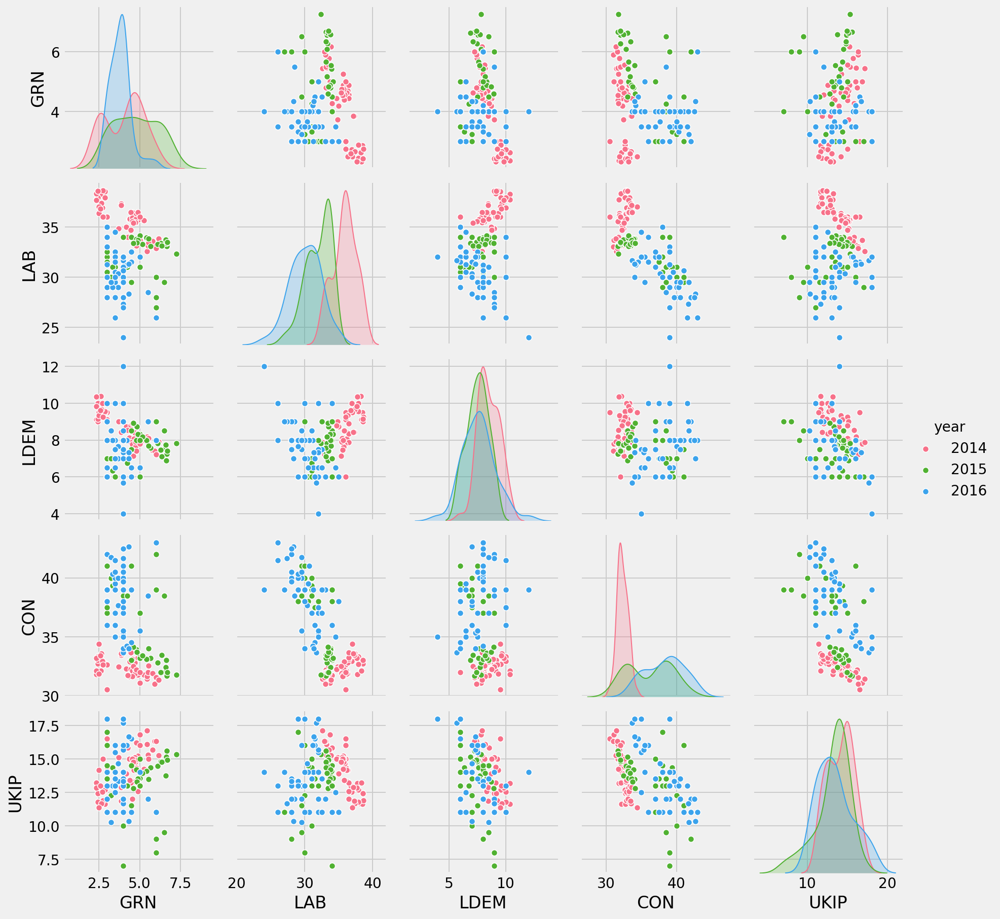

In [25]:
sns.pairplot(df_w.assign(year=df_w.index.year).query('2014 <= year <= 2016'),
             hue='year', palette="husl", vars=['GRN', 'LAB', 'LDEM', 'CON', 'UKIP'],
             diag_kws={"linewidth": 1})

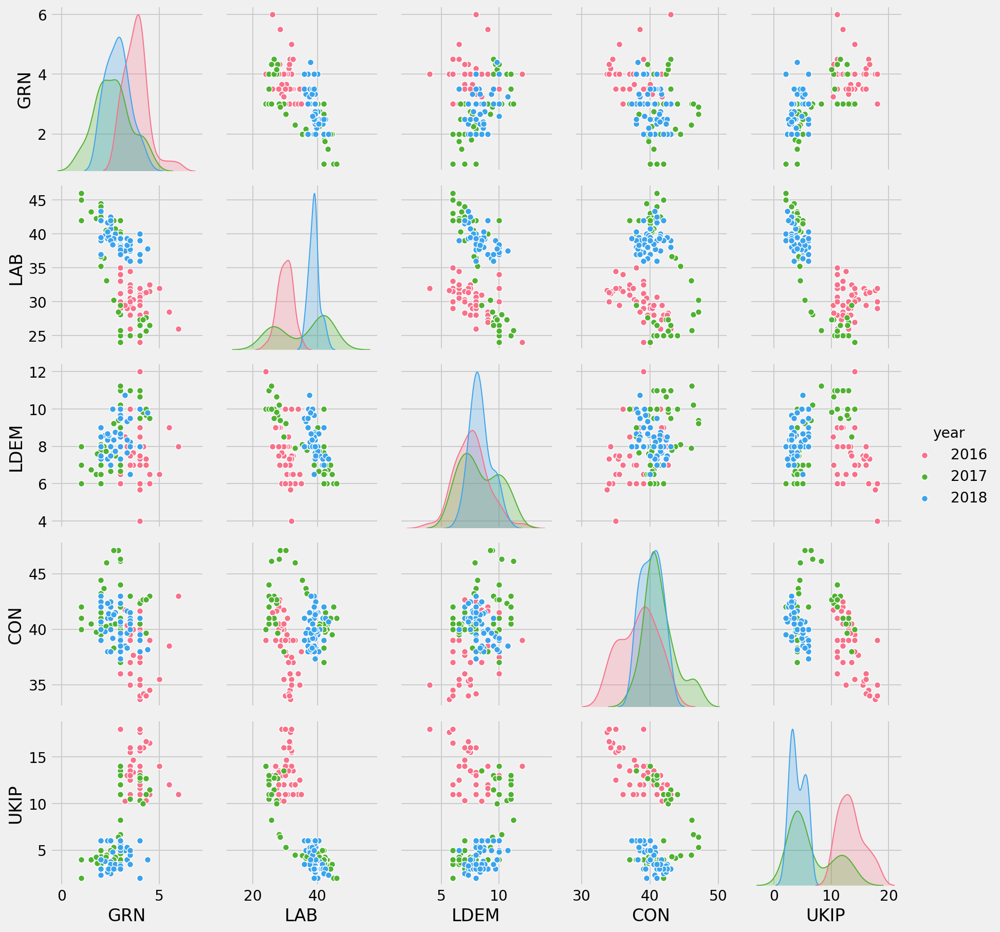

In [26]:
sns.pairplot(df_w.assign(year=df_w.index.year).query('2016 <= year <= 2018'),
             hue='year', palette="husl", vars=['GRN', 'LAB', 'LDEM', 'CON', 'UKIP'],
             diag_kws={"linewidth": 1})

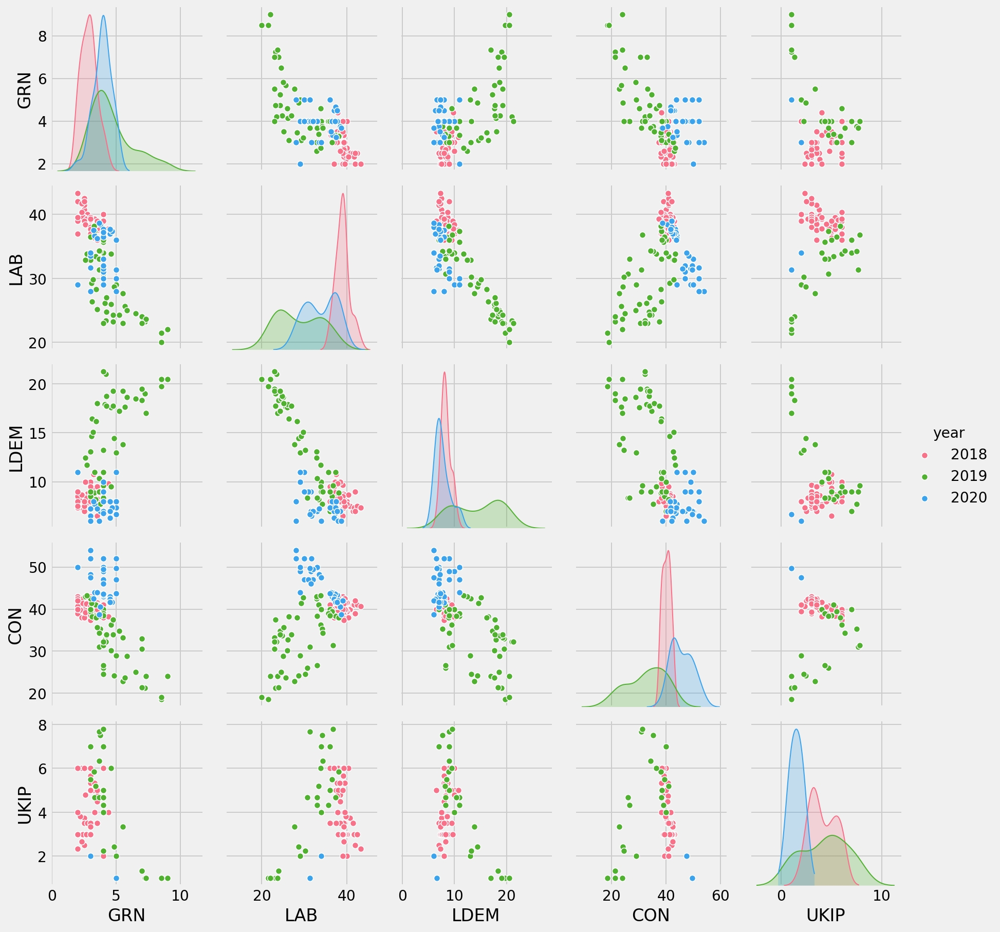

In [27]:
sns.pairplot(df_w.assign(year=df_w.index.year).query('2018 <= year <= 2020'),
             hue='year', palette="husl", vars=['GRN', 'LAB', 'LDEM', 'CON', 'UKIP'],
             diag_kws={"linewidth": 1})

/home/ubuntu/anaconda3/envs/email-service/lib/python3.8/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/home/ubuntu/anaconda3/envs/email-service/lib/python3.8/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/home/ubuntu/anaconda3/envs/email-service/lib/python3.8/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (wh

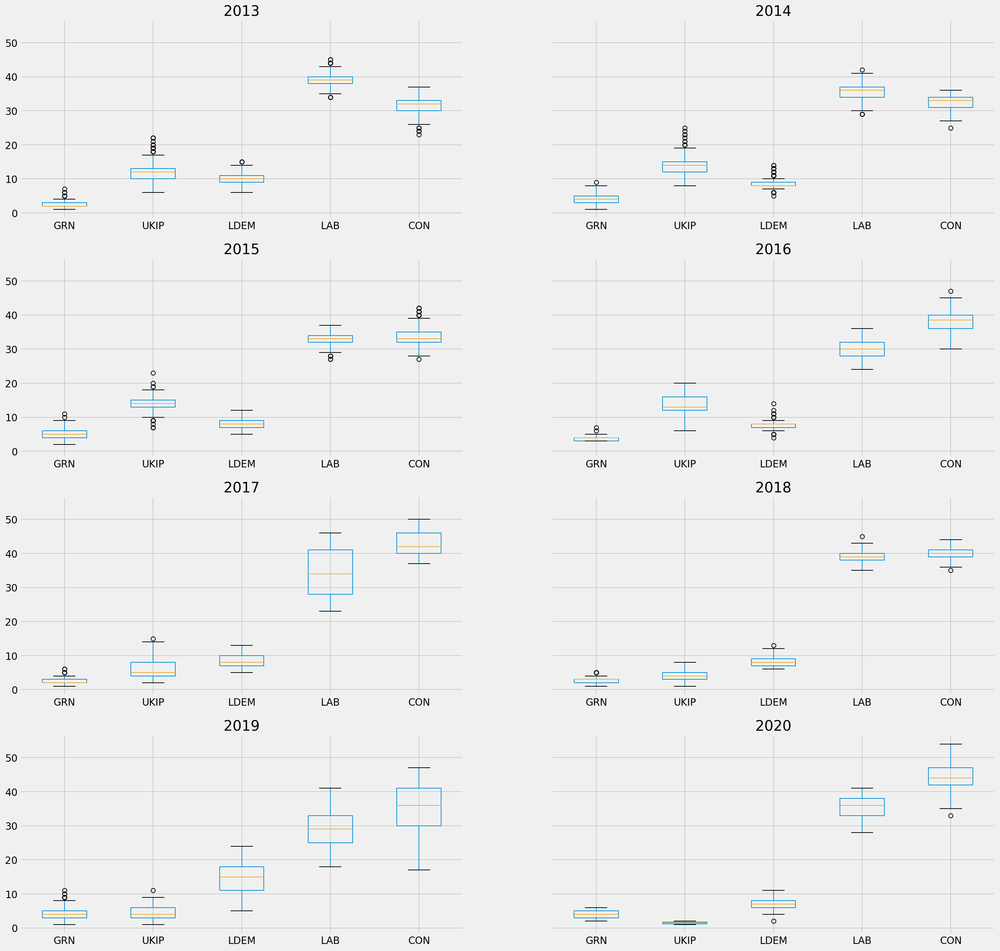

In [28]:
tmp = df[df.index.year >= 2013][["GRN", "UKIP", "LDEM", "LAB", "CON"]]
tmp.groupby(tmp.index.year).boxplot(figsize=(24, 24), layout=(4, 2));

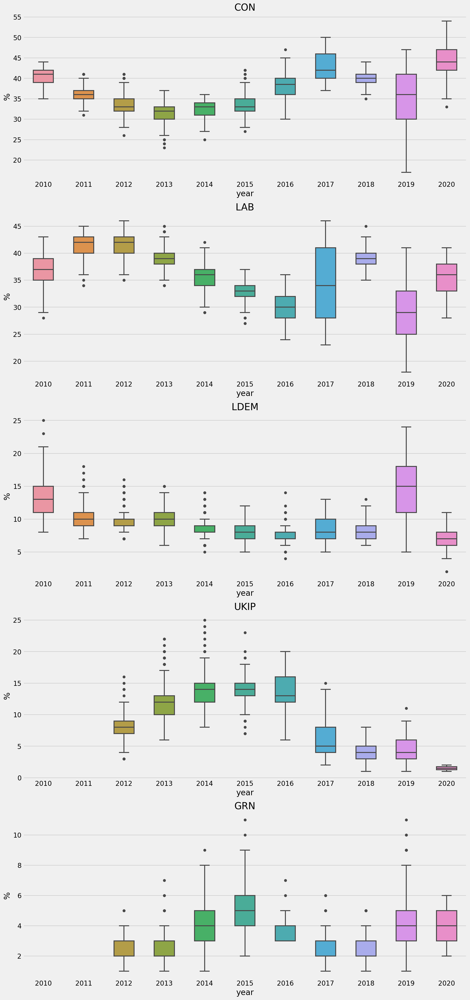

In [29]:
boxprops = {"linewidth": 2}
medianprops = {"linewidth": 2}
whiskerprops = {"linewidth": 2}
capprops = {"linewidth": 2}
flierprops = {"marker": "o"}
fig, axes = plt.subplots(5, 1, figsize=(15, 35))
for party, ax in zip(['CON', 'LAB', 'LDEM', 'UKIP', 'GRN'], axes):
    sns.boxplot(data=df.assign(year=df.index.year), x='year', y=party, width=0.5, ax=ax,
                boxprops=boxprops, medianprops=medianprops, whiskerprops=whiskerprops, capprops=capprops, flierprops=flierprops)
    ax.set_title(party)
    ax.set_ylabel("%")

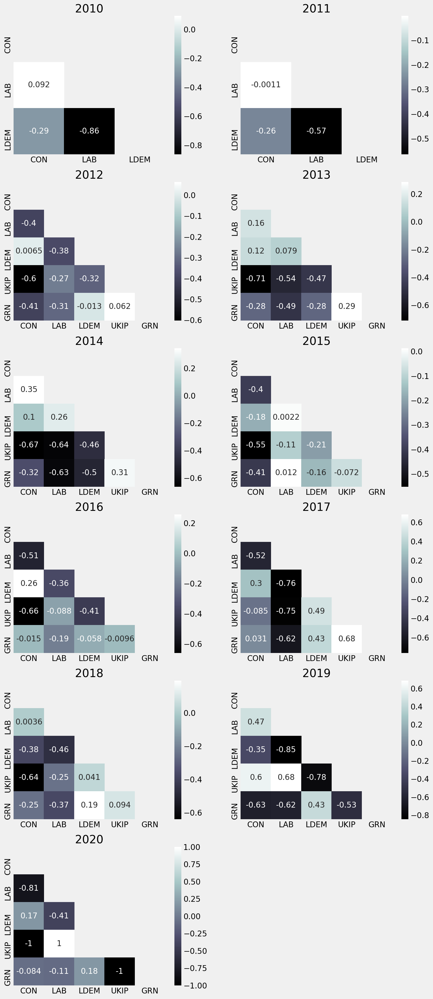

In [30]:
correlations = df.groupby(df.index.year)[['CON', 'LAB', 'LDEM', 'UKIP', 'GRN']].corr().transpose()
fig, axes = plt.subplots(6, 2, figsize=(12, 30))
for year, (i, j) in zip(df.index.year.unique(), product(range(6), range(2))):
    corr = (correlations[year]
            .dropna(how="all", axis="rows")
            .dropna(how="all", axis="columns"))
    mask = np.zeros_like(corr, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True
    sns.heatmap(corr,
                annot=True,
                ax=axes[i][j],
                mask=mask,
                cmap='bone')
    axes[i][j].set_title(year)
axes[5, 1].remove() 

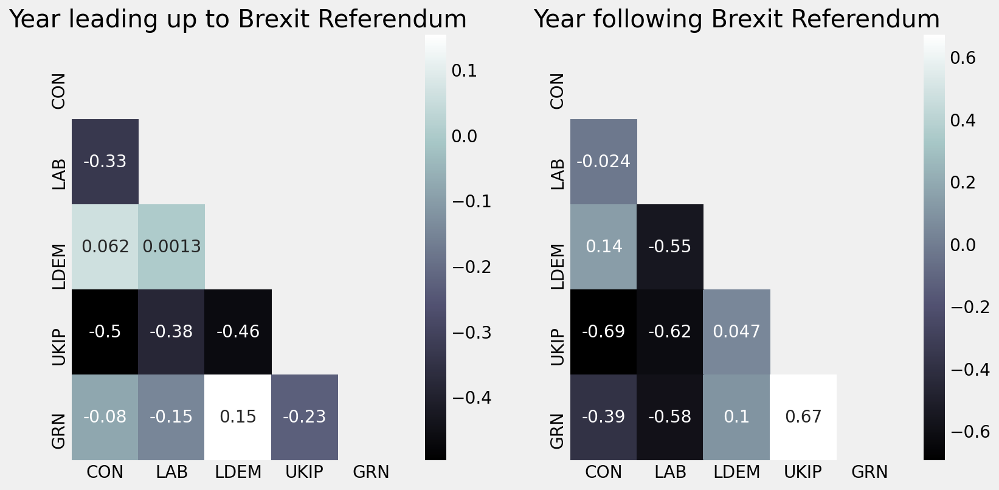

In [31]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
corr = df[(df.index >= pd.to_datetime("23 June 2015")) & (df.index <= pd.to_datetime("23 June 2016"))][['CON', 'LAB', 'LDEM', 'UKIP', 'GRN']].corr()
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(corr,
            annot=True,
            ax=ax1,
            mask=mask,
            cmap='bone')
ax1.set_title("Year leading up to Brexit Referendum")
corr = df[(df.index >= pd.to_datetime("23 June 2016")) & (df.index <= pd.to_datetime("23 June 2017"))][['CON', 'LAB', 'LDEM', 'UKIP', 'GRN']].corr()
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(corr,
            annot=True,
            ax=ax2,
            mask=mask,
            cmap='bone')
ax2.set_title("Year following Brexit Referendum");

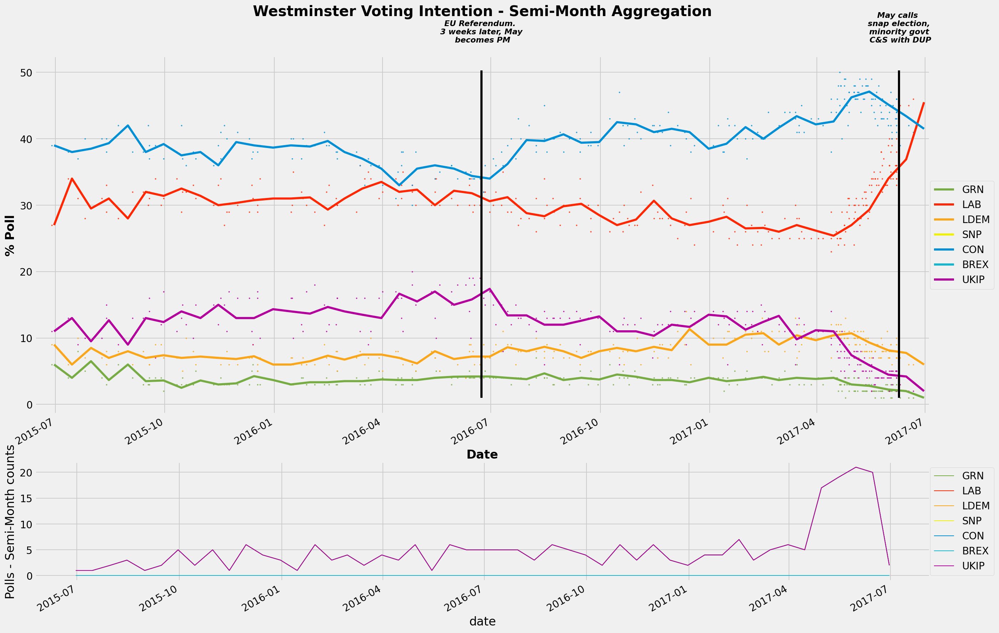

In [32]:
fig, ax = plot_vote_intention(df[(df.index >= pd.to_datetime("23 June 2015")) & (df.index <= pd.to_datetime("23 June 2017"))], agg="SM", add_lifetime_context=True)
ax.texts = [text_obj for text_obj in ax.texts
 if (text_obj._x >= pd.to_datetime("23 June 2015")) & (text_obj._x <= pd.to_datetime("23 June 2017"))]